# <center> Measuring the Hubble Constant </center>

## Abstract 
    This analysis derives an estimate for the Hubble constant of $H_0 = (73.99 \pm 14.92)$km s$^-1$Mpc$^-1$, by fitting a model through the Stan-module. The fit is preformed on 1114 Cepheids from 19 host galaxies and the megamaser system NGC 4258, using 19 known supernova (SN) type 1a to fit for the absolute B-band magnitude of NGC 4258. The Cepheid and SN 1a data is provided by Riss et al. 2016, originally gathered with the Wide Field Camera 3 (WFC3) on the Hubble Space Telescope (HST) in the optical and NIR field. The errors are found to be significantly larger than those of Riss et al. The errors are considered unreliable, and further analysis is necessary to determine if this estimate is accurate. The value found for the Hubble constant occurs to be reasonable as a local estimation, as it coincides well with the value found by Riss et al. [2016]. 
    
# Introduction
The size and the age of our universe has for a long time been characterized by large uncertainties. Much due to the uncertain distance estimations and the lack of sufficient photometry of standardizable astronomical objects. The value of the Hubble constant $H_0$ is therefore disputed, but new photometry provided WFC3 on the Hubble space telescope  yields opportunities for better calibration of astronomical properties. In this analysis a combination of methods are assembled in order to fit a model to the magnitude of a SN 1a in the megamaser system NGC 4258. Exploiting the well established distance to this system, based on analysis of water masers, an estimate of the Hubble constant can be provided. 

In this article I utilize the Stan module to fit a model provided by Riss et al. [Riss et al., 2016]() for SN 1a and Cepheid magnitudes. The Cepheid data is obtained through the VizieR distribution of the Riss et al. Cepheids, and the Wesenheit magnitude is calculated to deredden the data. To make sure the Stan module works a model is first fitted for the Cepheids only in NGC 4258. In section D this model is expanded to include the all 20 host galaxies, where the relative distance between NGC 2458 and the other galaxies is treated as a nuisance parameter. The constraints and consistency with the Riss et al distance modulus is evaluated, before the SNe 1a data of Riss et al is incorporated to fit a model for the apparent magnitude of a SN 1a in the NGC 4258 galaxy. Finally the Hubble constant is estimated from the median fit of the NGC 4258 SN 1a. 

A good measurement of the Hubble constant is interesting not only in it self, but also as a comparative basis. Like pointed out by Riss et al., when H$_0$ is compared to the cosmic microwave  background radiation it provides two absolute scales at opposite ends of the visible expansion of the Universe. Possibly providing information about fundamental physics in the likes of dark energy, gravitational physics and additional relativistic particles. 


## A.1 Obtaining Cepheid data

The data is obtained through the VizieR Catalog Service through the paper. The data of [table 4](http://vizier.cfa.harvard.edu/viz-bin/VizieR?-source=J/ApJ/826/56) from [Riss et al. 2016](https://arxiv.org/abs/1604.01424) contains data from 1486 Cepheids of 21 galaxies.
contains
The M31 galaxy is discarded due to several obstacles with the available data for the host, as denoted by Riss et al. (2016). In section B a dereddening will be done on all available Cepheids by applying the Wesenheit magnitude. This calculation is based on the available F555W and F816W filters, which the PHAT HST program which obtained the HST data did not use. Thus there is no way to use the same individual, mean V_I colors to deredden the H-band data as for the Cepheids in the 19 other host galaxies. For the M31 the best available color for measuring individual dereddening of the Cepheids are the F110W-F160W colors, which demands a recalibration in order to match the V-I reddening data of the other hosts. The only currently measured M31 Cepheids are early-type stars who's detached eclipsing binary distances include significant inputs from non-LTE stellar model atmospheres with systematic uncertainties that are hard to assess. Thus it is not reasonable to consider M31 as an anchor on equal footing with the other hosts, due to the available information per today.  

In [1]:
""" Initial modules and settings
"""

import matplotlib.pyplot as plt, matplotlib, seaborn as sns 
from tqdm import trange 
import numpy as np
import arviz
import corner
%matplotlib inline
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import MaxNLocator
import pandas as pd 
from astropy.table import Table

import os   # need this to get pystan working on laptop
os.environ['MACOSX_DEPLOYMENT_TARGET'] = '10.9' # need this to get pystan working on laptop
import pystan
import arviz


# Suppress warnings
# Comment this out if you wish to see the warning messages
import warnings
warnings.filterwarnings('ignore')

# General Plot Layout Parameters
matplotlib.rcParams['figure.figsize']  = (20.0, 10.0)
matplotlib.rcParams['axes.grid']       = False
matplotlib.rcParams['font.size']       = 30
matplotlib.rcParams['font.family']     = 'OfficinaSanITCBoo'
matplotlib.rcParams['axes.labelsize']  = 0.8*plt.rcParams['font.size']
matplotlib.rcParams['axes.titlesize']  = 0.9*plt.rcParams['font.size']
matplotlib.rcParams['legend.fontsize'] = plt.rcParams['font.size']
matplotlib.rcParams['xtick.labelsize'] = 0.5*plt.rcParams['font.size']
matplotlib.rcParams['ytick.labelsize'] = 0.5*plt.rcParams['font.size']
matplotlib.rcParams['scatter.marker']  = 'o'
matplotlib.rcParams['axes.titlepad']   = 20
matplotlib.rcParams['axes.labelpad']   = 20
matplotlib.rcParams['xtick.major.pad'] ='10'
matplotlib.rcParams['ytick.major.pad'] ='10'

In [2]:
filename = 'Riss_Table4_Data.fit'
dat = Table.read(filename, format='fits')
df = dat.to_pandas()

df = df[~(df['Gal'] == 'M31  ')] 
df[0:1113:150]

,Gal,ID,Per,V-I,F160W,sigTot,__O_H_
0,M101,115287,17.95,0.96,22.47,0.30,9.134
150,M101,678246,19.56,1.08,22.81,0.23,9.114
300,N1309,47225,69.33,1.11,24.57,0.22,8.804
450,N2442,269188,26.25,1.23,25.25,0.54,8.944
600,N3370,134313,46.56,1.23,24.70,0.20,8.606
750,N3982,32060,46.98,1.34,24.30,0.43,9.015
900,N5584,143986,60.58,1.36,24.17,0.24,8.707
1050,N4258,MI017153,14.93,1.60,23.96,0.48,8.995


_Table 1: The table above illustrates the avilable information of all 1114 Cepheids. The Cepheid host galaxy is provided as well as a Cepheid identification number. The Cepheid period is avilbael in units of days, "Per". The magnitude difference between the Optical V band between 500 and 600 nm and Optical I band between 750 and 1000 nm is given in units of magnitude [mag]. It is the  HST Color Index close to V-I, e.g. F555W-F814W. The F160W is the near infra read (NIR) magnitude around 1.6$\mu$ given in \[mag\]. The \[sigTot\] is the total statistical uncertainty in Cepheid magnitude given in [mag]. The O-H relation is the position-based metallicity estimate, 12+log(0/H) from Hoffmann et al. (in prep)._

# B.1 Wesenheit magnitude

_For each of the remaining 20 galaxies, plot the Cepheid period vs. apparent “Wesenheit” magnitude relation. First you’ll need to calculate the Wesenheit magnitude. Explain what the point of Wesenheit magnitudes is. Why don’t we just use F160W_

The Cepheids can be used as standard candels for the distance measurements, but in order to do so one needs flux measurments. These are usually done with HST filters at known phases in optical (F555W, F814W) and NIR (F160W) bands to correct for the effects of interstellar dust and the nonzero width in temperature of the Cepheid instability strip. To preforme a dereddening of the data the Wesenheit magnitude defined by Madore [Madore, 1992]()

<center>$m_H^W = m_H-R(V-I)$ </center>

More information about the Wesenheit magnitude and the reason for it's application is given in the appendix, section A. It would not be sufficient to use only the F160W band, as the reddening would yield large errors in the distance estimates. The Cepheid period - appearent Wesenheit magnitude relation is plotted for all 20 galaxies. The Cepheids in each galaxy is colored by their metallicity, where the zeropoint vary in each galaxy due to the fact that each galaxy is at a different distance. 

In [3]:
R = 0.39
def Wesenheit_magnitude(M_h, R, diff_VI):
    """ Returns the Wesenheit magnitude
    """
    return M_h-R*diff_VI

df['M_w'] = Wesenheit_magnitude(df['F160W'],R,df['V-I'])

Cepheid period vs. Wesenheit magnitude relation


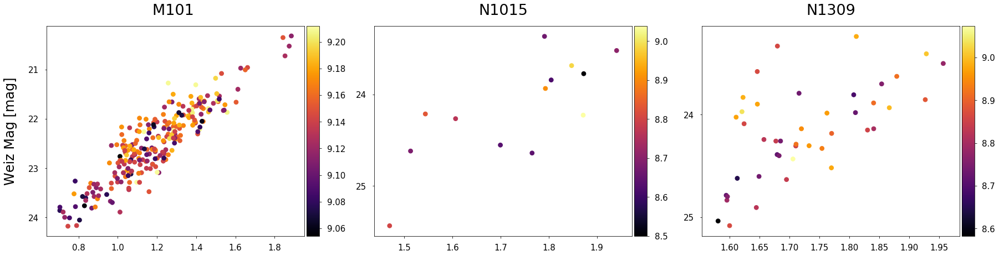

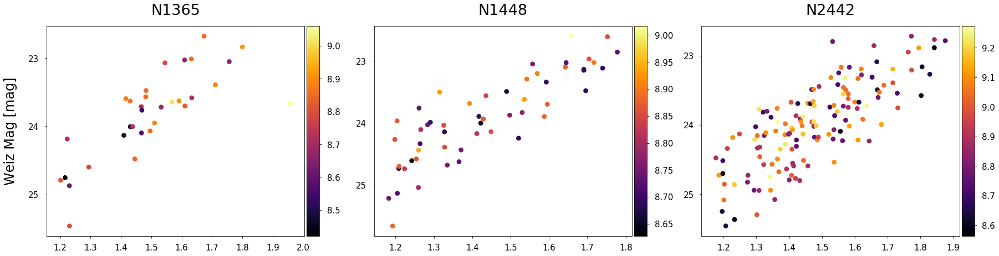

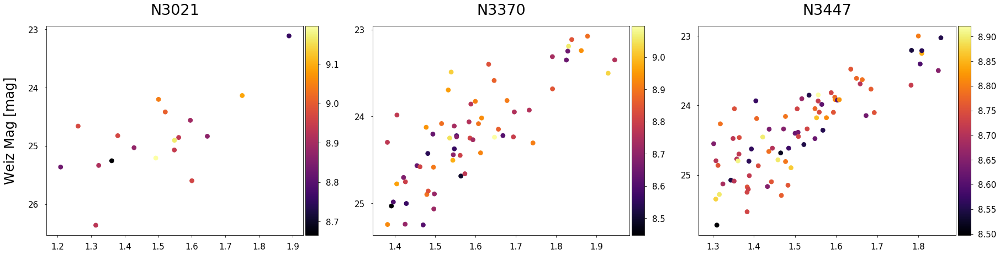

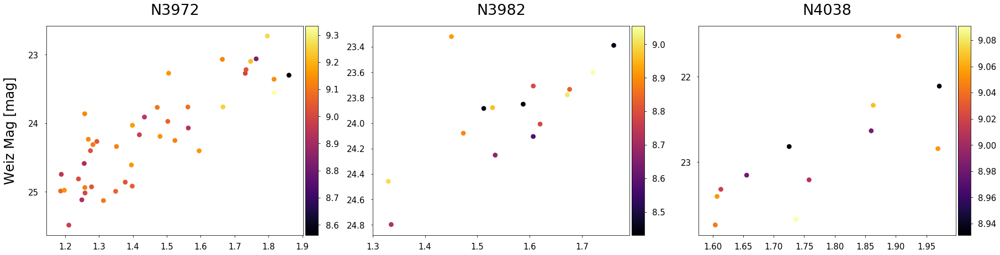

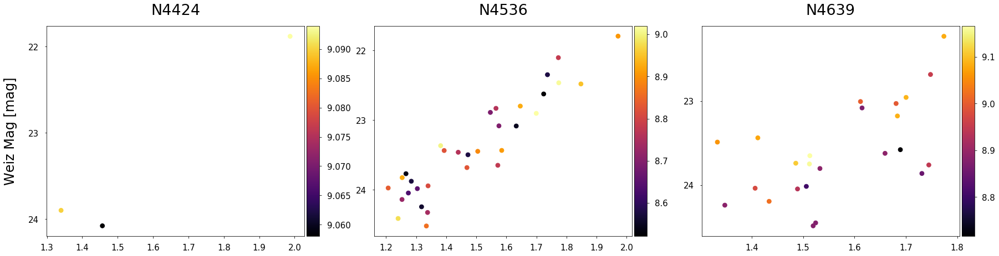

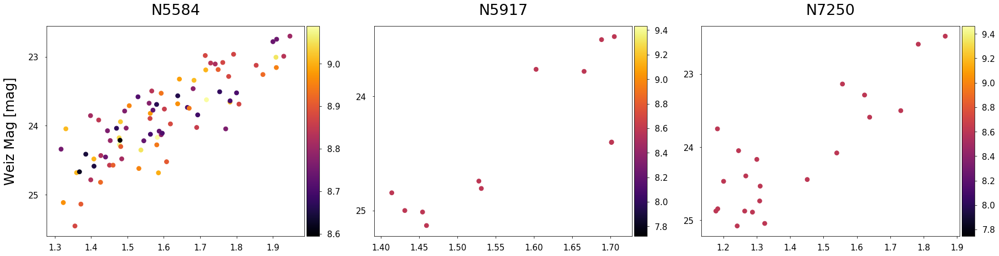

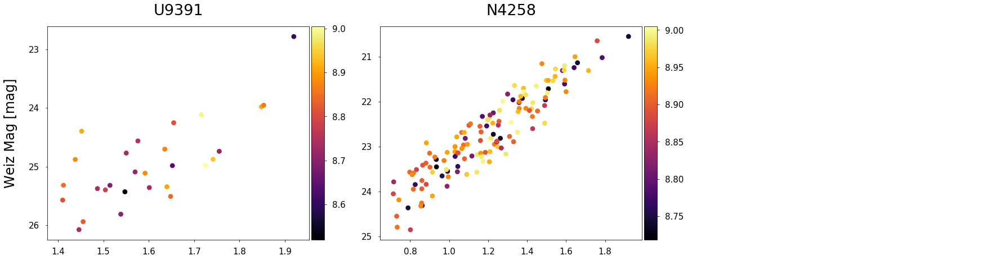

In [4]:
def plot_PM(idx_1, idx_2, plotindex, ax, x_label):
    scatter = ax[plotindex].scatter(np.log10(df['Per'][idx_1:idx_2]), df['M_w'][idx_1:idx_2], c = df['__O_H_'][idx_1:idx_2], cmap = 'inferno', s = 60)
    ax[plotindex].invert_yaxis()
    ax[plotindex].set_title(f"{df['Gal'][idx_2]}")
    
    divider = make_axes_locatable(ax[plotindex])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    plt.colorbar(scatter, cax = cax, orientation='vertical')
    
    ax[plotindex].yaxis.set_major_locator(MaxNLocator(integer=True))
    
    if plotindex == 0:
        ax[plotindex].set_ylabel('Weiz Mag [mag]')
    if x_label == 16:
        ax[plotindex].set_xlabel('log Period [d]')


        
idx_galaxy = [0] + [i for i in range(len(df['Gal'])-1) if (df['Gal'][i] != df['Gal'][i+1])] + [len(df['Per'])-1]

for i in range(0,20,3):
    try:
        fig, ax = plt.subplots(1, 3, figsize=(30, 7))
        plot_PM(idx_galaxy[i], idx_galaxy[i+1], 0, ax, i)
        plot_PM(idx_galaxy[i+1]+1,idx_galaxy[i+2], 1, ax, i)
        plot_PM(idx_galaxy[i+2]+1,idx_galaxy[i+3], 2, ax,i)
    except IndexError:
        ax[-1].axis('off')
        pass
plt.show()    


_Plot 1: Cepheid period vs. Wesenheit magnitude relation of all galaxies considered in this analysis. The Cepheids are colored by their O/H metallicity, where the zero point varies from galaxy to galaxy._

## B.2 Trends in the metallicity

Even though one usually expects to find a metallicity gradient in the PM plots, there is no obvious trends to be observed in the data presented above. Perhaps a consideration of more extensive metallicity rates would yield an observable trend. 


# C.1 Inferring a model for the Period-apparent magnitude relation in NGC 4258

In this section a period-apparent magnitude relation will be inferred for the galaxy NGC 4258, where the implementation and the sampling of the model is done in [Stan](https://mc-stan.org/). This is a simplification of the model to be implemented in the next section for all Cepheid in all host galaxies, where NGC 4258 will be used as an distance anchor. 

The megamaser system NGC 4258 is particularly useful because its distance is known very precisely. The measurements preformed by Humphreys et al estimated the distance to $\mu_{0,N4258} = 29.387\pm 0.00568 $. I.e. a measurement to 3%, implying an opportunity of
significant decrease in estimated errors in derivations of the Hubble constant.

The new geometric distance estimate was derived using water maser line-of-sight velocities and sky positions from 18 epochs of very long baseline interferometry observations (VLBI), and line of sight accelerations measured from a 10 year monitoring program of the 22 GHz maser emission of NGC 4258. The maser emission positions, line-of-sight velocities and -accelerations were combined and implemented in a Markov chain Monte Carlo (McMc) fitting program based on a Markov-chain trail parameters selection preformed by the Metropolis-Hastings algorithm. The model used 13 global parameters able to take into account both the warping and confocal elliptical maser orbits with differential precession. The McMc then yielded the lowest $\chi^2$ of the trials, and had so established an "base" model for the megamaser distance. 

The NGC 4258 can not be used to directly determine the Hubble constant to high accuracy, due to the fact that the galaxy is relatively close and its peculiar motion could be a large fraction of its redshift. It is on the other hand very suitable to be used as an anchor for the Cepheid-calibrated extragalactic distance scale. The use of water masers to derive the Hubble constant remains important because it does not share the systematic uncertainties of the other methods. For instance by using the CMB and the distance ladder assumption associated with the Cepheid method [Humphreys et al., 2013](https://arxiv.org/abs/1307.6031). This application of water masers to determine distances are however restricted as there is only a limited set of known water masers. This is not necessarily applicable to the other galaxies as it is dependent on having sufficient data of megamaser motions.

The model fitted to the NGC 4258 is described as


<center> $m_H^W = zp_{W,NGC4258} + b_W\log{P}+ Z_W\Delta \log(O/H)$ </center>


where P is the period in days, and $\Delta \log(O/H)$ is the metallicity with respect to the Solar oxygen abundance log(O/H) = 8.66. zp$_{W,NGC4258}$,  b$_W$ and z$_W$ are free parameters to be fitted for. The fit is also done for the intrinsic scatter in the relation.

In [5]:
solar_O_H = 8.66
df['Delta log(O/H)'] = df['__O_H_'] - solar_O_H

N4258 = df[(df['Gal'] == 'N4258')] 

In [6]:
stan_code = """
data {{
// define the data within Stan
    int<lower=0> N;            // number of data points    
    real logP[N];              // logP values     
    real delta_OH[N];          // delta_OH values     
    real mag[N];               // y values            
    real<lower=0> sigma[N];    // y error bars
}}
parameters {{
// model parameters
    real bw;                 //  slope of line 
    real zw;                 //  slope of line  
    real zp;                 //  y-intercept  
    real is;
}}
transformed parameters{{
// construct the model (i.e., theta= zp + bw*logP + zw*delta_OH)
    real theta[N];
    real err[N];
    for (j in 1:N)
        theta[j] = bw * logP[j] +zw*delta_OH[j]+ zp;
    for (j in 1:N)
        err[j] = sqrt(square(sigma[j]) + square(is));
}}
model {{
    bw ~ uniform({bw_lower}, {bw_upper});   
    zw ~ uniform({zw_lower}, {zw_upper});    
    zp ~ uniform({zp_lower}, {zp_upper});   // y-intercept has a uniform distribution
    is ~ uniform({is_lower}, {is_upper});
    mag ~ normal(theta, err);            // data points have a normal distribution -> Gaussian likelihood function
}}
"""

# set the data
linear_data = {'N': len(N4258['M_w']),
               'logP': np.log10(N4258['Per']),
               'delta_OH': N4258['Delta log(O/H)'],
               'mag': N4258['M_w'],
               'sigma': N4258['sigTot'] } 

# set prior characteristics 
stan_dict = {}
stan_dict['bw_lower'] = -5
stan_dict['bw_upper'] = 0
stan_dict['zw_lower'] = -5
stan_dict['zw_upper'] = 5
stan_dict['zp_lower'] = 0
stan_dict['zp_upper'] = 30
stan_dict['is_lower'] = 0
stan_dict['is_upper'] = 5


# create the model
sm = pystan.StanModel(model_code=stan_code.format(**stan_dict))

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_e67fe243495069cc9dd50e1ec22b3f36 NOW.


In [7]:
Nsamples = 15000 # number of samples
warmup = 5000 # number of burn in samples (stan default is half of Nsamples)
chains = 4 # number of chains
thin = 5 # discard every n=thin samples in the end 
seed = 128 # random seed for starting the chain

# run the model
fit = sm.sampling(data=linear_data, iter=Nsamples, chains=chains, warmup=warmup, thin=thin, seed=seed)

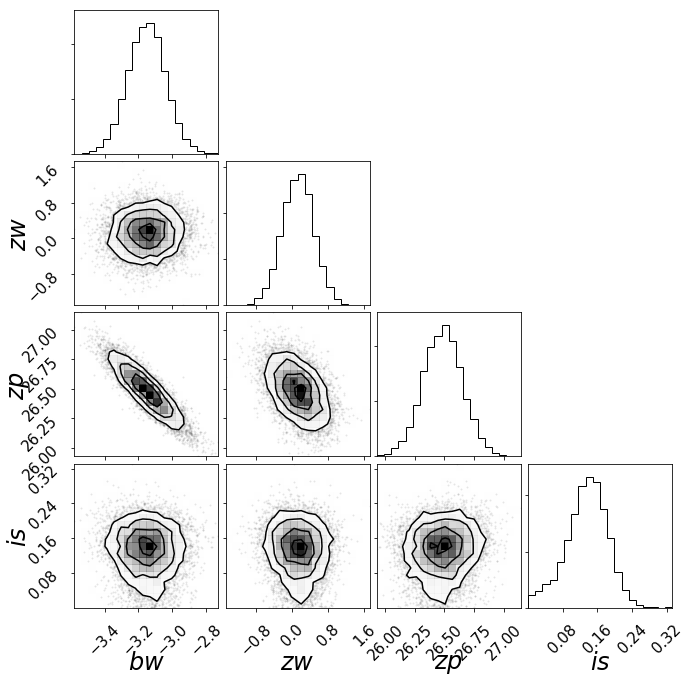

In [8]:
la = fit.extract(permuted=True)   # fit contains all information on chains
postsamples = np.vstack((la['bw'], la['zw'], la['zp'], la['is'])).T  # pull out parameters of interest and reshape them
fig = corner.corner(postsamples, labels=[r"$bw$",r"$zw$", r"$zp$", r"$is$"])  # let's make a corner plot

_Plot 2: Corner plot illustrating constraints on the model of section C. Some covariance is evident._

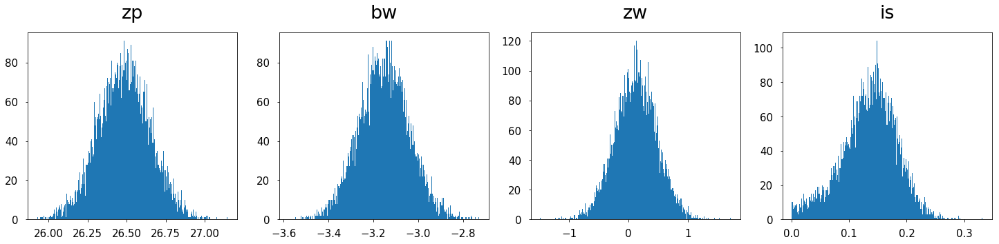

In [9]:
def plot_distributions(parameter):
    fig, ax = plt.subplots(1, 4, figsize=(25, 5))
    for i in range(len(parameter)):
        ax[i].set_title(parameter[i])
        ax[i].hist(la[parameter[i]],300)
    plt.show()

plot_distributions(['zp','bw','zw','is'])

_Plot 3: Diagnostic plots for the distributions of the estimated parameters. Some convergence seems to have taken place for all parameters._

In [10]:
#compute summary statistics: 50, 16, 84 percentiles
bw_fit, zw_fit, zp_fit, is_fit = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(postsamples, [16, 50, 84],
                                                axis=0)))

print(f"fit median, +/- for zp : {zp_fit[0]:.3f},  {zp_fit[1]:.3f}, {zp_fit[2]:.3f}\n")
print(f"fit median, +/- for bw : {bw_fit[0]:.3f},  {bw_fit[1]:.3f}, {bw_fit[2]:.3f}\n")
print(f"fit median, +/- for zw : {zw_fit[0]:.3f},  {zw_fit[1]:.3f}, {zw_fit[2]:.3f}\n")
print(f"fit median, +/- for is : {is_fit[0]:.3f},  {is_fit[1]:.3f}, {is_fit[2]:.3f}\n")

fit median, +/- for zp : 26.484,  0.163, 0.167

fit median, +/- for bw : -3.151,  0.109, 0.112

fit median, +/- for zw : 0.127,  0.340, 0.356

fit median, +/- for is : 0.139,  0.042, 0.050



# C.2 

With some covariances between the parameters the model is found to be
<par></par>

<center> $m_H^W = 26.468 - 3.140\log{P}+ 0.120 \Delta \log(O/H)$ </center>



# D.1  Inferring a model for the P-M relation of all galaxies

In this section a model is constructed for the Cepheid period-luminosity relation using all galaxies simultaneously. The model is hierarchical and based on the following assumptions

1. that the period – absolute magnitude relation is the same in all galaxies (when the metallicity trend is accounted for)

2. while the distances to different galaxies are different, all Cepheids in the same galaxy have the same distance

The model to be fit is described by Riss et al. (Riss et al., 2019), where the distance moduli of individual galaxies relative to that of NGC 4258 is treated as a nuisance parameter.

<center> $m_{H,i,j}^W = (\mu_{0,i}-\mu_{0,N4258}) + zp_{W,NGC4258} + b_W\log{P}+ Z_W\Delta \log(O/H)$ </center>

where $\mu_{0,i}-\mu_{0,N4258}$ is the relative distance from galaxy i to NGC 4258 and the rest of the parameters are as above. 

In [11]:
gal                      = np.array(idx_galaxy) + np.ones(len(idx_galaxy))
galaxy_names             = [df['Gal'][i] for i in gal if i < gal[-1]]
galaxy_Identification    = np.zeros(len(df['Gal']))
galaxy_Identification[0] = 1

for i in range(len(idx_galaxy)-1):
    galaxy_Identification[idx_galaxy[i]+1:idx_galaxy[i+1]+1] = i + 1

galaxy_Identification    = np.array([int(i) for i in galaxy_Identification]).T

In [12]:
stan_code = """
data {{
// define the data within Stan
    int<lower=0> N;            // number of data points    
    real logP[N];              // logP values     
    real delta_OH[N];          // delta_OH values     
    real mag[N];               // y values            
    int gal_ID[N];
    real<lower=0> sigma[N];    // y error bars
    real zp;
    int<lower=0> num_galaxy;
}}
parameters {{
// model parameters
    real bw;                 //  slope of line 
    real zw;                 //  slope of line  
    real is;
    real mu[num_galaxy];
}}
transformed parameters{{
// construct the model (i.e., theta= d_module + zp + bw*logP + zw*delta_OH)
    real theta[N];
    real err[N];
    for (j in 1:N)
        theta[j] = bw * logP[j] +zw*delta_OH[j] + zp + mu[gal_ID[j]];
    for (j in 1:N)
        err[j] = sqrt(square(sigma[j]) + square(is));
}}
model {{
    bw ~ uniform({bw_lower}, {bw_upper});   
    zw ~ uniform({zw_lower}, {zw_upper});    
    is ~ uniform({is_lower}, {is_upper});
    mag ~ normal(theta, err);            // data points have a normal distribution -> Gaussian likelihood function
}}
"""

# set the data
linear_data = {'N': len(df['M_w']),
               'num_galaxy': int(len(galaxy_names)),
               'logP': np.log10(df['Per']),
               'delta_OH': df['Delta log(O/H)'],
               'mag': df['M_w'],
               'sigma': df['sigTot'],
               'zp': zp_fit[0],
               'gal_ID': galaxy_Identification
              } 

# set prior characteristics 
stan_dict = {}
stan_dict['bw_lower'] = -5
stan_dict['bw_upper'] = 0
stan_dict['zw_lower'] = -5
stan_dict['zw_upper'] = 5
stan_dict['is_lower'] = 0
stan_dict['is_upper'] = 5


# create the model
sm2 = pystan.StanModel(model_code=stan_code.format(**stan_dict))

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_71686da0a057b01e9e551651db5ce1c9 NOW.


In [13]:
Nsamples = 15000 # number of samples
warmup = 5000 # number of burn in samples (stan default is half of Nsamples)
chains = 4 # number of chains
thin = 5 # discard every n=thin samples in the end 
seed = 128 # random seed for starting the chain

# run the model
fit2 = sm2.sampling(data=linear_data, iter=Nsamples, chains=chains, warmup=warmup, thin=thin, seed=seed)


To run all diagnostics call pystan.check_hmc_diagnostics(fit)


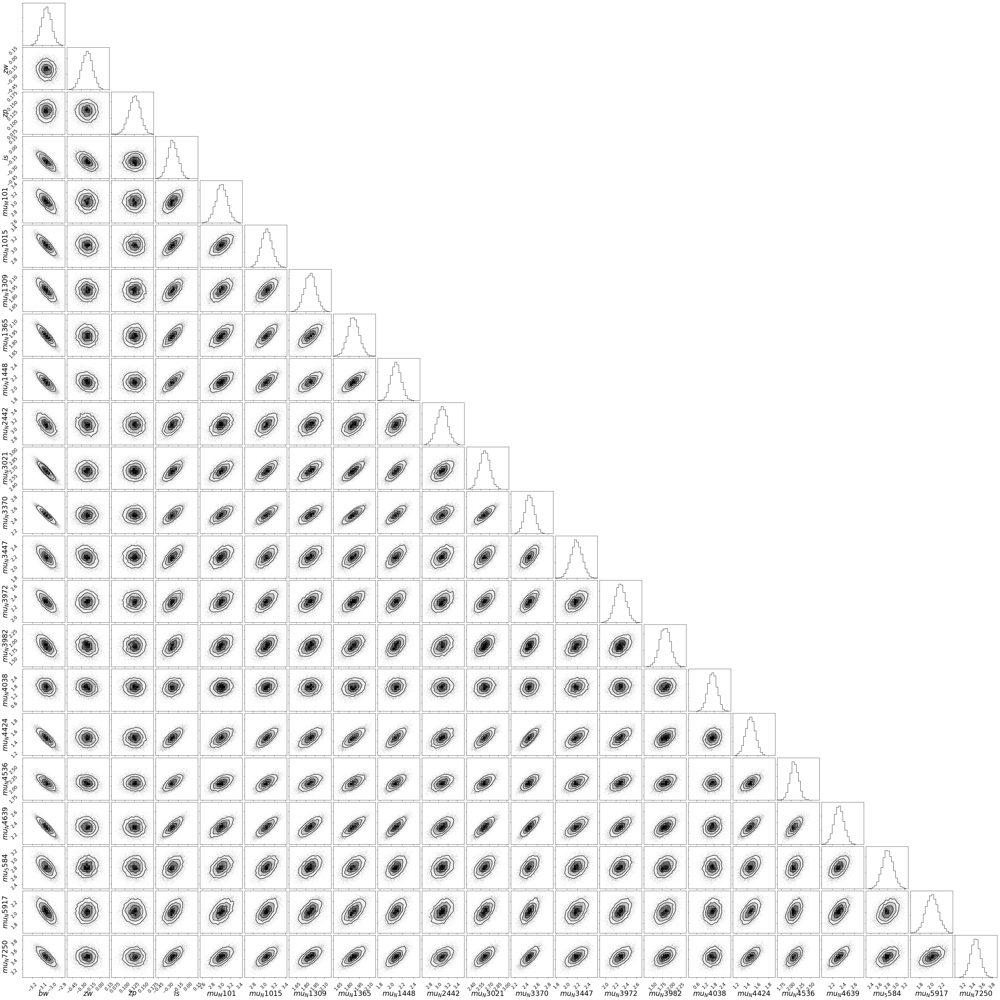

In [14]:
la2 = fit2.extract(permuted=True)   # fit contains all information on chains
postsamples2 = np.vstack((la2['bw'], la2['zw'],la2['is'],la2['mu'][:,0],la2['mu'][:,1],la2['mu'][:,2],la2['mu'][:,3],la2['mu'][:,4],la2['mu'][:,5],la2['mu'][:,6],la2['mu'][:,7],la2['mu'][:,8],la2['mu'][:,9],la2['mu'][:,10],la2['mu'][:,11],la2['mu'][:,12],la2['mu'][:,13],la2['mu'][:,14],la2['mu'][:,15],la2['mu'][:,16],la2['mu'][:,17],la2['mu'][:,18])).T  # pull out parameters of interest and reshape them
fig = corner.corner(postsamples2, labels=[r"$bw$",r"$zw$",r"$zp$", r"$is$",r"$mu_M101$",r"$mu_N1015$",r"$mu_N1309$",r"$mu_N1365$",r"$mu_N1448$",r"$mu_N2442$",r"$mu_N3021$",r"$mu_N3370$",r"$mu_N3447$",r"$mu_N3972$",r"$mu_N3982$",r"$mu_N4038$",r"$mu_N4424$",r"$mu_N4536$",r"$mu_N4639$",r"$mu_5584$",r"$mu_N5917$",r"$mu_N7250$",r"$mu_U9391$",r"$mu_N4258$"])  # let's make a corner plot


_Plot 4: Corner plot of constraints on the 24 parameters of the model constructed in section D. Some covariance is evident._

In [15]:
bw_fit2, zw_fit2, is_fit2, mu1,mu2,mu3,mu4,mu5,mu6,mu7,mu8,mu9,mu10,mu11,mu12,mu13,mu14,mu15,mu16,mu17,mu18,mu19 = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(postsamples2, [16, 50, 84],
                                                axis=0)))

mu_0_N4258 = 29.387
mu_0_N4258_err =  0.0568
mu = np.zeros((3,20))
mu_list = np.array([mu1,mu2,mu3,mu4,mu5,mu6,mu7,mu8,mu9,mu10,mu11,mu12,mu13,mu14,mu15,mu16,mu17,mu18,mu19])

for i in range(len(mu_list)):
    mu[:,i] = mu_list[i] + [mu_0_N4258,0,0]


#print(f"fit median, +/- for zp2: {zp_fit2[0]:.3f},  {zp_fit2[1]:.3f}, {zp_fit2[2]:.3f}")
#print(f"fit median, +/- for zp : {zp_fit[0]:.3f},  {zp_fit[1]:.3f}, {zp_fit[2]:.3f}\n")
    
print(f"fit median, +/- for bw2: {bw_fit2[0]:.3f},  {bw_fit2[1]:.3f}, {bw_fit2[2]:.3f}")
print(f"fit median, +/- for bw : {bw_fit[0]:.3f},  {bw_fit[1]:.3f}, {bw_fit[2]:.3f}\n")

print(f"fit median, +/- for zw2: {zw_fit2[0]:.3f},  {zw_fit2[1]:.3f}, {zw_fit2[2]:.3f}")
print(f"fit median, +/- for zw : {zw_fit[0]:.3f},  {zw_fit[1]:.3f}, {zw_fit[2]:.3f}\n")

print(f"fit median, +/- for is2: {is_fit2[0]:.3f},  {is_fit2[1]:.3f}, {is_fit2[2]:.3f}")
print(f"fit median, +/- for is : {is_fit[0]:.3f},  {is_fit[1]:.3f}, {is_fit[2]:.3f}\n")





fit median, +/- for bw2: -3.057,  0.048, 0.050
fit median, +/- for bw : -3.151,  0.109, 0.112

fit median, +/- for zw2: -0.207,  0.087, 0.090
fit median, +/- for zw : 0.127,  0.340, 0.356

fit median, +/- for is2: 0.126,  0.014, 0.015
fit median, +/- for is : 0.139,  0.042, 0.050



# E.1 Comparison of constraints from fit C and D
By over-plotting the constraints on the 4 free parameters zp, bw, zw and the intrinsic scattering of the period-luminosity relations obtained in d with the ones obtained in section c for NGC 4258 alone it is evident that the constraints are consistent. Although, it is also clear that the constraints from part d are significantly tighter, illustrated in red in the corner plot below.

_Note to instructors_: I have only plotted the constraints of 3 of the parameters du to the chooise of making zp constant from the first run, as I was not able to implement the last parameter variations of zp in my code and make it run properly on my computer. This is in theory easy to implement by letting zp vary over a smal range defined with the mean and standard deviations found in part C. This is although only concidered a minor source of error

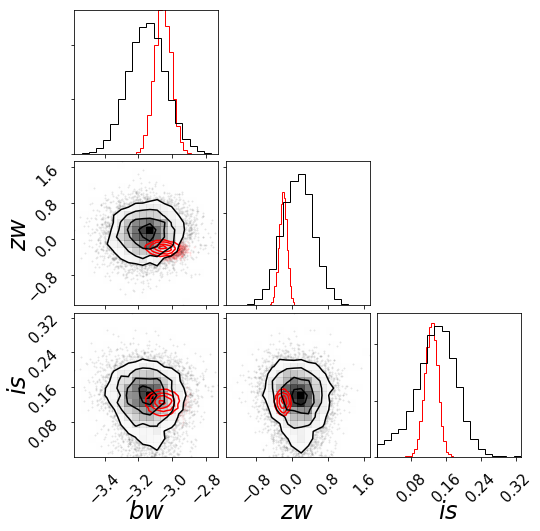

In [16]:
postsamples3 = np.vstack((la2['bw'], la2['zw'], la2['is'])).T

postsamples4 = np.vstack((la['bw'], la['zw'], la['is'])).T  
fig          = corner.corner(postsamples3, labels=[r"$bw$",r"$zw$", r"$is$",r"$mu$"], color = 'r')
corner.corner(postsamples4, labels=[r"$bw$",r"$zw$", r"$is$",r"$zp$"],fig=fig);

_Plot 5: Corner plot with comparison of parameters from section C and D._


# F.1 Comparison of distance modulus

When the distance moduli from this fit is compared to the fit of Riss et al. the consistency is quite good. The errors of this fit are significantly larger than those of Riss et al. for all galaxies, with a factor ranging from approximately 1.5-4.5 times as big. The actual distance modulus are quite good as well, and all estimates done by Riss et al. is within the uncertainties of the fit of the model above.

,Gal,Distance est [mag],Error est [mag],Distance Riss,Distance Error Riss [mag],error rel [mag]
0,M101,29.154557,0.075932,29.135,0.045,1.687386
1,N1015,32.391001,0.121951,32.497,0.081,1.505570
2,N1309,32.436670,0.099377,32.523,0.055,1.806857
3,N1365,31.259854,0.092561,31.307,0.057,1.623878
4,N1448,31.254360,0.082968,31.311,0.045,1.843737
5,N2442,31.474301,0.088236,31.511,0.053,1.664838
6,N3021,32.459322,0.118786,32.498,0.090,1.319845
7,N3370,32.002312,0.089541,32.072,0.049,1.827360
8,N3447,31.852874,0.081638,31.908,0.043,1.898547
9,N3972,31.567792,0.107014,31.587,0.070,1.528767


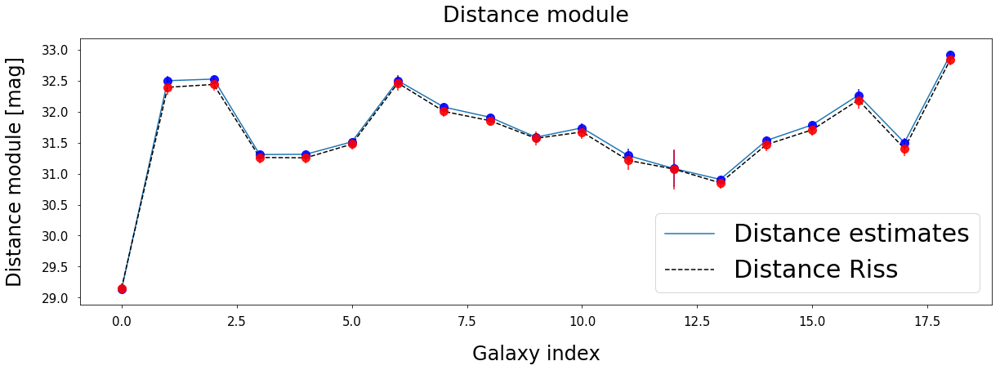

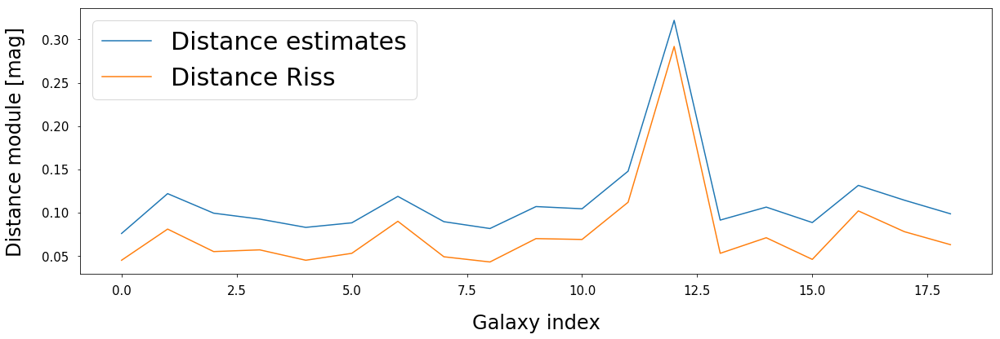

In [16]:
Riss_mu     = np.array([29.135, 32.497, 32.523, 31.307, 31.311, 31.511, 32.498, 32.072, 31.908, 31.587, 31.737, 31.290, 31.080, 30.906, 31.532, 31.786, 32.263, 31.499, 32.919])
Riss_mu_err = np.array([0.045, 0.081, 0.055, 0.057, 0.045, 0.053, 0.090, 0.049, 0.043, 0.070, 0.069, 0.112, 0.292, 0.053, 0.071, 0.046, 0.102, 0.078, 0.063])
plt.figure(figsize = (20,6))
x = [i for i in range(len(Riss_mu))]
plt.plot(Riss_mu, '')
plt.errorbar(x, Riss_mu, yerr=Riss_mu_err,ls='none', marker='o', ms=10, c='blue',alpha = 0.9)
plt.plot(mu[0,:-1], '--k')
plt.errorbar(x, mu[0,:-1], yerr = (mu[1,:-1] + mu[2,:-1])/2,ls='none', marker='o', ms=10, c='red', label='Errorbars', alpha = 0.9)
plt.legend(['Distance estimates','Distance Riss'])
plt.xlabel('Galaxy index')
plt.ylabel('Distance module [mag]')
plt.title("Distance module")

plt.figure(figsize = (20,6))
plt.plot((abs(mu[1,:-1]) + abs(mu[2,:-1]))/2)
plt.plot(Riss_mu_err)
plt.legend(['Distance estimates','Distance Riss'])
plt.xlabel('Galaxy index')
plt.ylabel('Distance module [mag]')

    
distances = pd.DataFrame({'Gal': galaxy_names[:-1],'Distance est [mag]': mu[0,:-1], 'Error est [mag]':(mu[1,:-1] + mu[2,:-1])/2 ,'Distance Riss': Riss_mu, 'Distance Error Riss [mag]': Riss_mu_err})
distances['error rel [mag]'] = distances['Error est [mag]']/distances['Distance Error Riss [mag]']
distances

_Tabel 2: Distances modulus from analysis and Riss et al. [2016] with errors_

_Plot 6: Comparison of distance modulus and errors from analysis and Riss et al. [2016]._

# G.1 Standardization & SN 1a

When a white dwarf acquires enough mass from a binary parter, the material in the dwarfs core will start to undergo runaway thermonuclear fusion. This becomes the cataclysmic explosion of that is known as a type 1a SN. Type SNe 1a are not strictly standard candles, but they are standardizable. That is, the SNe are often though to act as standardizable candles due to its width-luminosity relation (WLR), the observed relationship between the 1a's peak brightness and how rapidly this peak brightness is achieved and subsequently left behind. After the type 1a's are standardized it is believed that any remaining difference in the peak brightnesses of two SNe 1a should be due to differences in distance to the observer. Thus the measurement can be be done of the distances to the SNe 1a, that alongside with measurements of redshift can be used to infer the expansion of the universe through the construction of the distance-redshift relation [Wright & Li,2018](https://arxiv.org/abs/1710.07018).

If an astrophysical objects or event has a known intrinsic luminosity, it can be considered a standard candle. The reason why one often calls SNe 1a standardizable is due to observations of nearby events where it was found that all explosions had quite similar luminosities where we are able to correct for the relatively small variations. It is due to the existence of such small fluctuations and their homogeneous emissions that these events should be considered standardizable candles. [Coelho et al., 2015](https://arxiv.org/abs/1411.3596)

Even though the SNe 1a are described as homogeneous, they do exhibit variability in light curve shapes, colors, intrinsic luminosity and spectral features. Guy et al. illustrates how such a standardization can be preformed by finding correlations between the SN 1a observables, to improve the estimation of their intrinsic luminosity on an event-by-event basis to reduce the scatter in the distance estimates. Guy et al. parameterize the light curve model based on a minimal set consisting of a luminosity parameter, a decline rate parameter and one single color parameter. They construct a phenomenological model of the expected SN flux by varying the phase, wavelength, decline rate and color continuously. Thus they capture all features as once, making the model easily applicable to high-redshift SNe 1a measurements. They use a semi analytic model based on a global intensity parameter caring with redshift like the inverse of a luminosity distance squared, a time stretch factor, a color factor based on the B and V bands and the date of the maximum in the rest-frame B band. They then apply this to a training set of well-sampled nearby SNe Ia to build a multi-color light curve model. The fitting of these broadband light curves yields amongst other a B band magnitude at maximum in the SN Ia rest-frame [Guy et al.,2005](https://arxiv.org/abs/astro-ph/0506583). 

Riss et al. has already preformed this standardization on the B-band magnitudes of the SN 1a in the selected galaxies. Thus the SN 1a used to train the model below is taken directly from table 5 in Riss et al. In the model below the SNe 1a magnitudes are used alongside the Cepheids and the known distance modulus of NGC 4258 to determine the standardized absolute B-band magnitude of a SN 1a. The absolute magnitude is implemented as a free parameter, and once again fitted for using Stan. The model is based on the assumptions made previously, as well as 

    3. All SNe Ia have exactly the same standardized absolute magnitude
    4. SNe Ia and Cepheids in the same galaxy have the same distance
    5. The distance modulus to NGC 4258 is known


This simultaneous fit to all Cepheid and SN Ia data yields a fit for the quantity $m_{x, N4258}^0$. I.e. the expected reddening-free, fiducial, peak magnitude of a SN Ia appearing in NGC 4258. 

In [17]:
a_b = 0.71273
a_b_err = 0.00176

B_band_2 = np.array([13.310, 17.015, 16.765, 15.482, 15.765, 15.840, 16.527, 16.476, 16.265, 16.048, 15.795, 15.797, 15.110, 15.177, 15.983, 16.265, 16.572, 15.867, 17.034])
B_band_err = np.array([0.117,0.123,0.116,0.125,0.116,0.142,0.117,0.115,0.124,0.116,0.115,0.114,0.109,0.124,0.115,0.115,0.115,0.115,0.114])

In [23]:
stan_code = """
data {{
// define the data within Stan
    int<lower=0> N;            // number of data points    
    int<lower=0> n;
    real logP[N];              // logP values     
    real delta_OH[N];          // delta_OH values     
    real mag[N];               // y values            
    int gal_ID[N];
    real<lower=0> sigma[N];    // y error bars
    int<lower=0> num_galaxy;
    real zp;
    real N4258;
    real mag_B[n];
    real mag_B_err[n];
    real N4258_err;
    real ab_err;
}}
parameters {{
// model parameters
    real bw;                 //  slope of line 
    real zw;                 //  slope of line  
    real is;
    real is2;
    real mu[num_galaxy];
    real m_fit;
}}
transformed parameters{{
// construct the model (i.e., theta= d_module + zp + bw*logP + zw*delta_OH)
    real theta[N];
    real err[N];
    real phi[n];
    real err2[n];
    for (j in 1:N)
        theta[j] = bw * logP[j] +zw*delta_OH[j] + zp + mu[gal_ID[j]];
    for (j in 1:N)
        err[j] = sqrt(square(sigma[j]) + square(is));
    for (i in 1:n)
        phi[i] = mu[i] + m_fit;
    for (j in 1:n)
        err2[j] = sqrt(square(mag_B_err[j]) + square(is2));
    
}}
model {{
    bw ~ uniform({bw_lower}, {bw_upper});     
    zw ~ uniform({zw_lower}, {zw_upper});  
    is ~ uniform({is_lower}, {is_upper});
    is2 ~ uniform({is_lower}, {is_upper});
    mag ~ normal(theta, err);            
    mag_B ~ normal(phi, err2);
}}
"""

# set the data
linear_data = {'N': len(df['M_w']),
               'num_galaxy': int(len(galaxy_names)),
               'logP': np.log10(df['Per']),
               'delta_OH': df['Delta log(O/H)'],
               'mag': df['M_w'],
               'sigma': df['sigTot'],
               'zp': zp_fit[0],
               'gal_ID': galaxy_Identification,
               'mag_B': B_band_2,
               'mag_B_err': B_band_err,
               'n': len(B_band_2),
               'N4258': mu_0_N4258,
               'N4258_err': mu_0_N4258_err,
               'ab_err': a_b_err
              } 

# set prior characteristics 
stan_dict = {}
stan_dict['bw_upper'] = 0.0
stan_dict['bw_lower'] = -5.0
stan_dict['zw_lower'] = -5.0
stan_dict['zw_upper'] = 5.0
stan_dict['is_lower'] = 0
stan_dict['is_upper'] = 5
stan_dict['m_fit_lower'] = 0
stan_dict['m_fit_upper'] = 20

# create the model
sm3 = pystan.StanModel(model_code=stan_code.format(**stan_dict))



INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_45833a313f9b9ef2e2af26ccf8311c38 NOW.


In [27]:
Nsamples = 30000 # number of samples
warmup = 15000 # number of burn in samples (stan default is half of Nsamples)
chains = 4 # number of chains
thin = 5 # discard every n=thin samples in the end 
seed = 128 # random seed for starting the chain


fit3 = sm3.sampling(data=linear_data, iter=Nsamples, chains=chains, warmup=warmup, thin=thin, seed=seed)
la3 = fit3.extract(permuted=True)

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


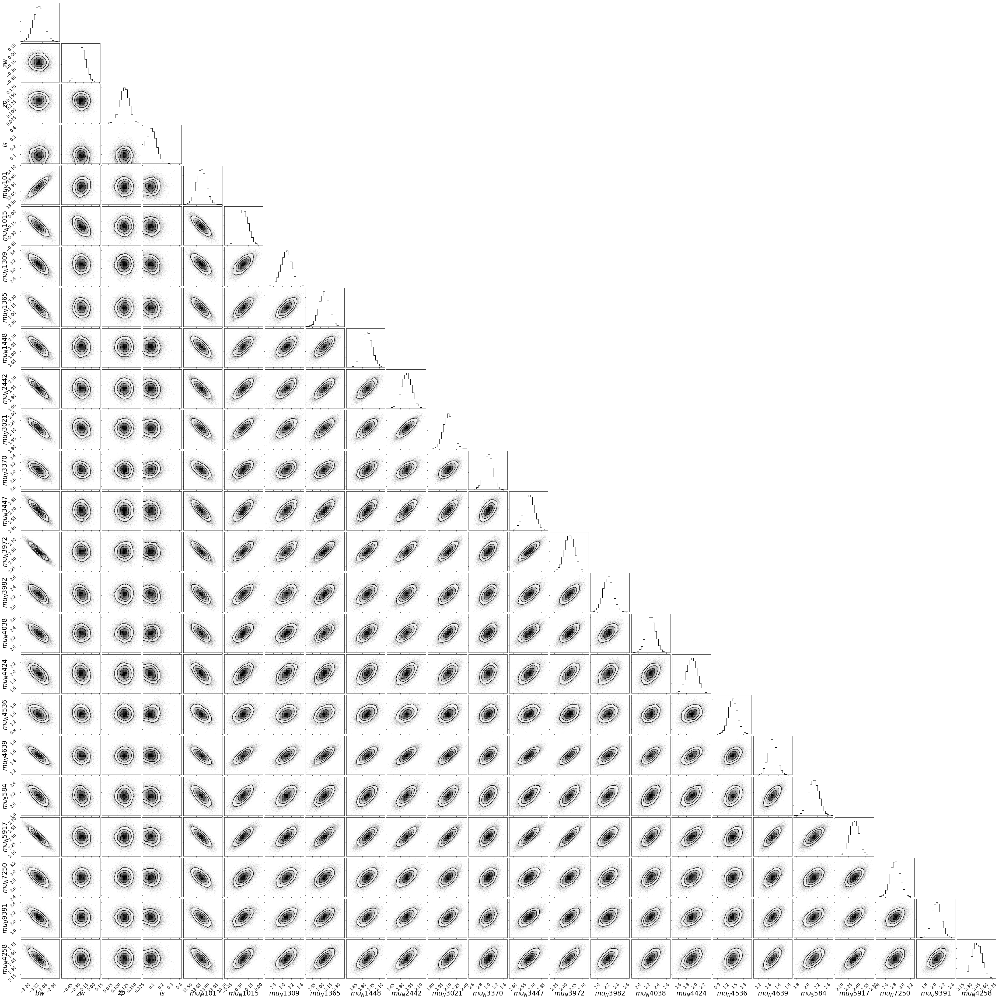

In [28]:
postsamples5 = np.vstack((la3['bw'], la3['zw'], la3['is'],la3['is2'],la3['m_fit'],la3['mu'][:,0],la3['mu'][:,1],la3['mu'][:,2],la3['mu'][:,3],la3['mu'][:,4],la3['mu'][:,5],la3['mu'][:,6],la3['mu'][:,7],la3['mu'][:,8],la3['mu'][:,9],la3['mu'][:,10],la3['mu'][:,11],la3['mu'][:,12],la3['mu'][:,13],la3['mu'][:,14],la3['mu'][:,15],la3['mu'][:,16],la3['mu'][:,17],la3['mu'][:,18])).T

bw_fit3, zw_fit3, is_fit3,is2_fit3, m_fit,mu1,mu2,mu3,mu4,mu5,mu6,mu7,mu8,mu9,mu10,mu11,mu12,mu13,mu14,mu15,mu16,mu17,mu18,mu19 = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(postsamples5, [16, 50, 84],
                                                axis=0)))


fig = corner.corner(postsamples5, labels=[r"$bw$",r"$zw$", r"$zp$", r"$is$",r"$mu_M101$",r"$mu_N1015$",r"$mu_N1309$",r"$mu_N1365$",r"$mu_N1448$",r"$mu_N2442$",r"$mu_N3021$",r"$mu_N3370$",r"$mu_N3447$",r"$mu_N3972$",r"$mu_N3982$",r"$mu_N4038$",r"$mu_N4424$",r"$mu_N4536$",r"$mu_N4639$",r"$mu_5584$",r"$mu_N5917$",r"$mu_N7250$",r"$mu_U9391$",r"$mu_N4258$", r"$m_fit$"])  # let's make a corner plot

_Plot 7: Corner plot showing constraints of parameters in the final model for estimation of the apparent magnitude in NGC 4258_

In [47]:
print(f'appearent magnitude = {m_fit[0]:.3f}')
H = 10**((m_fit[0] -mu_0_N4258 + 25)/5)
error_H = np.log(10)*H*np.sqrt(((m_fit[1] + m_fit[2])/2)**2 + a_b_err**2)
print(f'Hubbel constant: {H:.3f}')
print(f'Hubbel constant error: {error_H:.3f}')
print(f'Error precentage: {error_H/H:.3f}')

appearent magnitude = 13.733
Hubbel constant: 73.987
Hubbel constant error: 14.922
Error precentage: 0.202


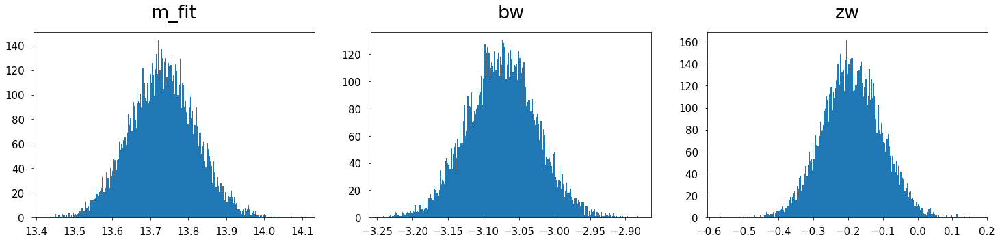

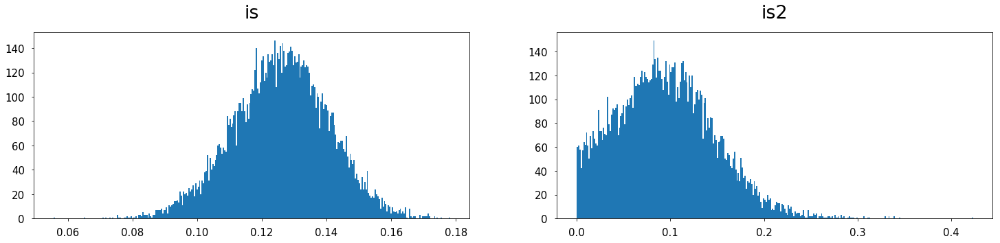

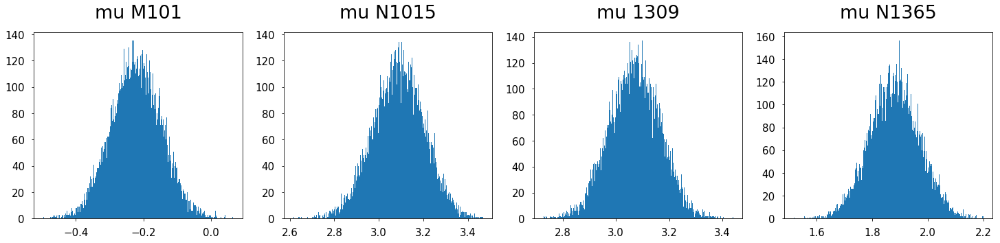

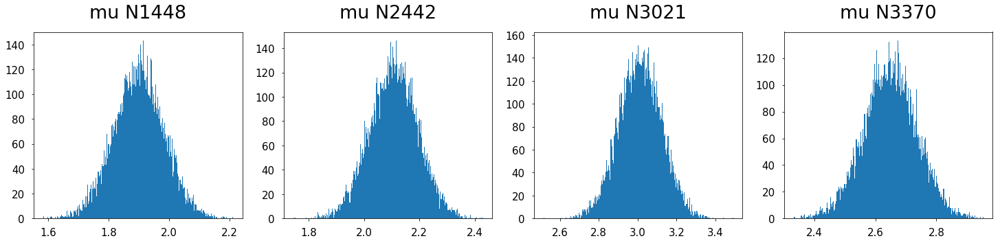

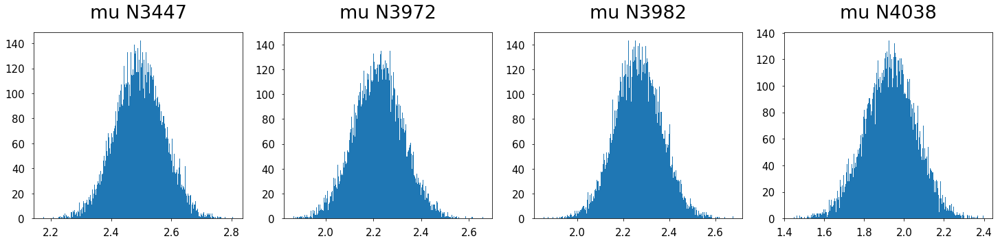

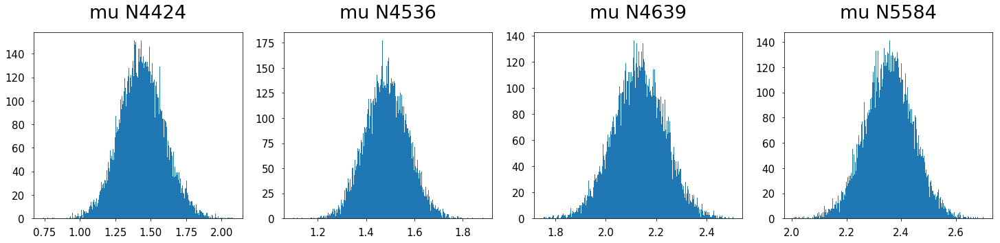

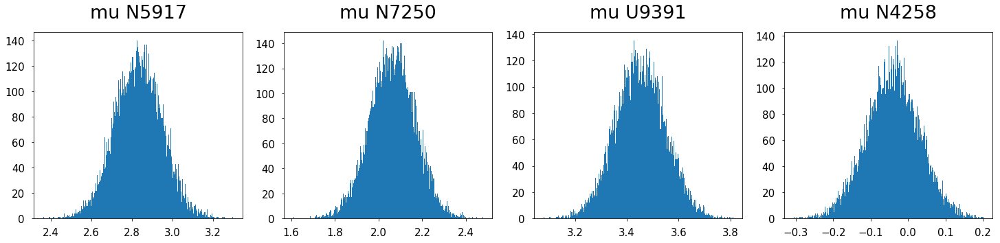

In [31]:
def plot_distributions_2(parameter,number):
    fig, ax = plt.subplots(1, number, figsize=(25, 5))
    for i in range(len(parameter)):
        ax[i].set_title(parameter[i])
        ax[i].hist(la3[parameter[i]],300)
    plt.show()
    
def plot_distributions_3(index,parameter,number):
    fig, ax = plt.subplots(1, number, figsize=(25, 5))
    for i in range(len(parameter)):
        ax[i].set_title(parameter[i])
        ax[i].hist(la3['mu'][:,index[i]],300)
    plt.show()
    
plot_distributions_2(['m_fit','bw','zw'],3)
plot_distributions_2(['is','is2'],2)

plot_distributions_3([0,1,2,3],['mu M101','mu N1015','mu 1309','mu N1365'],4)
plot_distributions_3([4,5,6,7],['mu N1448','mu N2442','mu N3021','mu N3370'],4)
plot_distributions_3([8,9,10,11],['mu N3447','mu N3972','mu N3982','mu N4038'],4)
plot_distributions_3([12,13,14,15],['mu N4424','mu N4536','mu N4639','mu N5584'],4)
plot_distributions_3([16,17,18,19],['mu N5917','mu N7250','mu U9391','mu N4258'],4)
    

_Plot 8: Diagnostics plot showing convergense of the parameters in section G._

## H.2

All parameters estimated in the model appares to have converged properly and formed a gaussian distribution. The cornerplot's revales some covariance amongs them, further adjustments should be preformed to reduce the covariance.


# I.1 Reflections on assumptions, errors and results

The most important assumptions made under this analysis were

    1. that the period – absolute magnitude relation is the same in all galaxies (when the metallicity trend is accounted for)
    2. while the distances to different galaxies are different, all Cepheids in the same galaxy have the same distance
    3. All SNe Ia have exactly the same standardized absolute magnitude
    4. SNe Ia and Cepheids in the same galaxy have the same distance
    5. The distance modulus to NGC 4258 is known

Most of them assumptions seems to be quite fair given the purpose of the analysis, even though these simplification obviously increase the uncertainty of the result. The approximation of treating all SNe Ia and Cepheids in the same galaxy to have the same distance from earth yields a source of uncertainty. However, this is likely small compared to the errors associated with the chosen method. Furthermore it seams fair to assume that the distance modulus of 4258 is quite precise and that theoretically the SNe 1a should have very similar standardized absolute magnitudes. The errors associated with these values are significantly smaller than the ones produced by this evaluation method, as is known because Riss et al uses the same values but are able to produce an error of 1.74km s$^-1$Mpc$^-1$. The very first assumption on the other hand seems more unreliable due to the fact that we only considered the Oxygen-Hydrogen metallicity in this analysis. Further metallicity ratios should be accounted for in order to precisely be able to take the trends into account. 

The errors estimated by this analysis are much larger than those estimated by Riss et al, that is respectively 20% versus 2.4%. It appears likely that the error propagation undertaken here is not completely just, and that a wrong conclusion has been drawn at some point in regards to the errors. Further analysis is required to evaluate if there is an error in the error propagation or if the chosen estimation method yields errors of this magnitude. A better way of estimating the error would although probably be to incorporate all errors in to the fit through Stan, and use the standard deviation of the distribution as the real error. 

Despite these deviations in the error estimates, the actual value estimated for the Hubble constant of 73.99 km s$^-1$Mpc$^-1$ is quite consistent with the best estimate produced by Riss et al. of (73.24 $\pm 1.74$) km s$^-1$Mpc$^-1$. It is even within the frames of the uncertainty produced by Riss et al. As one of the most acknowledged estimates of the Hubble constant, there is therefor reason to believe that the model constructed in this analysis is quite good. That is, if the error estimation is more thoroughly evaluated and applied. 

The value of H$_0$ found both by this analysis and by Riss et al. deviates significantly from the value obtained from fitting the cosmic microwave background, which is $H_0 = (66.93 \pm 0.62) $km s$^-1$Mpc$^-1$ at a $3.4\sigma$ level. Whether or not this is a result of physics beyond the standard ΛCDM cosmological
model, underestimated uncertainties or something else is hard to say. It is tempting to suggest that it might not be due to underestimated uncertainties as the paper produced by Riss et al (Riss et al., 2016) preformed a very thorough error analysis. Even though it might be possible that some larger systematic error in the local $H_0$ or CMB may be underlaying. It seems more reasonable to think in the direction of the existence of some unexpected feature in the cosmological model that suggest them. Riss et al. provides an intriguing idea about how a local determination of H0 might differ from the global cosmological estimation. That the two values should be the same is based on the assumption that the universe is homogeneous and isotropic. This assumption in light of discoveries like the theoretical indications of dark matter seams unjust. That this inhomogeneity of matter probably exists is a compelling argument that speaks to important variations in H$_0$ [Riss et al., 2016]. On the other hand, the simulations preformed by Oddersko et al. [2016] of the effects of inhomogeneities on the local value of H$_0$ is said to be an indicator that this might not be the reason after all.


# Conclusion

In this analysis we have built a distance ladder to estimate a local value of the Hubble Constant. The Hubble constant was found to be $H_0 = (73.99 \pm 14.92)$km s$^-1$Mpc$^-1$, which is somewhat consistent with the findings of Riss et al. in regards to the actual value of the Hubble constant. However, the error estimates of this analysis were found to be remarkably large and are considered somewhat unreliable. This estimate is consistent
in regards to the tension between a local and global estimation of $H_0$. This is not to surprising as the model built in this analysis were based upon multiple of the same values and principles as the analysis preformed by Riss et al. 

# Appendix 

# A. The Wesenheit function

The Wesenheit function applied to period-luminosity relations as described by Madore [Madore, 1981] forms a per definition extinction free representation of the magnitude:


<center>$m_H^W = m_H-R(V-I)$ </center>

The reddening-free quantity $m_H^W $ is a linearly independent combination of the observed appearent magnitude $m_H$ in the NIR band and the apparent colors V and I in the optical band. Furthermore, $m_H^W $ is numericall equal to the intrinsic values of the two magnitudes and colors so combined [Madore, 1982]. The value R is the ratio of total-to-selective absorption formulated as 

<center>$R = \dfrac{A_H}{A_V-A_I}$ </center>

The value of R due to the correlation between Cepheid intrinsic color and luminosity is very similar to the value due to extinction [Riss et al., 2011]. The choosen R used here was derived for the latter to reduce the intrinsic scatter coused by the breath of the instability strip, and set to R = 0.39 initially after the Fitzpatric formulation [Fitzpatrick, 1999]. R efficiently quantifies a lower sensitivity to uncertainties in the reddening law, and ranges from 0.3 to 0.5 in the F160W NIR band depending on the reddening law. Initially R can be taken as 0.39 after the Fitzpatric (1999) formulation. 
 
In beeing an extinction free representation of the magnitude an implicit formulation of the problem is created that effectivly removes many of the traps and uncertainites assoscieted with the methodolgogy of absolute calibrations of colors and magnitudes of Cepheids. The Wesenheit function allows us to avoid solivng explicitly for the reddening star by star.

The equation maked use of an adopted standard reddening line in regards to the bands, and linear combinations of the magnitudes and colors that cancels out the reddening without ever explicitly determining it. This is possible due to the fact that W is defined by the properties of the interstellar medium, and is independent of the acctual object it is applied to. (https://ned.ipac.caltech.edu/level5/Cepheids/Cepheids14.html).



# References 

[1] Riss et al., 2016, arXiv:1604.01424 [astro-ph.CO]

[2] Riss et al., 2009, arXiv:0905.0695v1 [astro-ph.CO] 

[3] Fitzpatrick, E. L. 1999, PASP, 111, 63, arXiv:astro-ph/9809387

[4] Madore, B. F. 1982, ApJ, 253, 575, 1982ApJ...253..575M

[5] Wright & Li, 2017,  arXiv:1710.07018v2 [astro-ph.CO] 

[6] Cohelo et al. 2015, arXiv:1411.3596 [astro-ph.CO]

[7] Guy et al., 2005, arXiv:astro-ph/0506583v2